In [1]:
import geopandas as gpd
from pyproj import Proj, transform
from shapely.geometry import Point
import numpy as np
import pandas as pd
from scipy import stats
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
import seaborn as sns
import contextily as ctx
from pyproj import Proj, transform
import matplotlib.pyplot as plt
from scipy.stats import kurtosis, skew
import dask.dataframe as dd
from rasterio.transform import from_origin
import numpy as np
import rasterio
from shapely.ops import unary_union

/home/virgilxw/miniforge3/envs/processor/lib/python3.12/site-packages/dask/dataframe/_pyarrow_compat.py:23: UserWarning: You are using pyarrow version 11.0.0 which is known to be insecure. See https://www.cve.org/CVERecord?id=CVE-2023-47248 for further details. Please upgrade to pyarrow>=14.0.1 or install pyarrow-hotfix to patch your current version.
  warnings.warn(


In [2]:
local_crs = 27700
place = "test"
lat = 55.86421405612109
lng = -4.251846930489373
country = "UK"
crs=4326
radius=1

In [3]:
if lng:
    lon = lng

In [4]:
lonlat=(lon, lat)

In [5]:
buildings = gpd.read_parquet(f"./output/{place}/buildings_morphometric_var.pq")
tessellation = gpd.read_parquet(f"./output/{place}/tessellation_morphometric_var.pq")
edges = gpd.read_parquet(f"output/{place}/edges.pq")
nodes = gpd.read_parquet(f"output/{place}/nodes.pq")
stroke = gpd.read_parquet(f"output/{place}/stroke_gdf.pq")

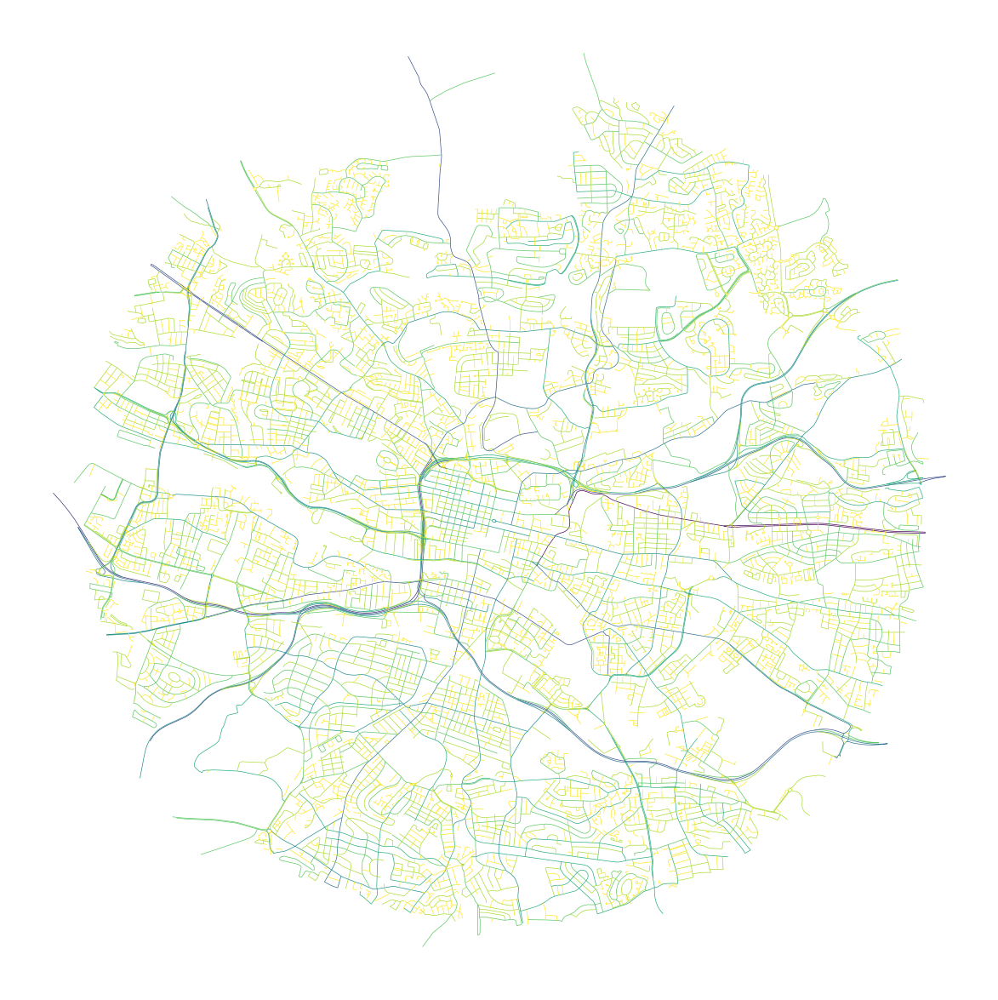

In [6]:
stroke.plot(stroke.length,
                figsize=(15, 15),
                cmap="viridis_r",
                linewidth=.5,
                scheme="headtailbreaks"
               ).set_axis_off()

In [7]:
stroke["stroke_length"] = stroke.length
stroke = stroke.drop(columns=["n_segments"])

In [8]:
buildings_merged = buildings.merge(tessellation.drop(columns=['geometry']), on='uID', how='inner')
buildings_merged_centroids = buildings_merged
buildings_merged_centroids["geometry"] = buildings_merged_centroids['geometry'].centroid

In [9]:
# Your latitude and longitude tuple (latitude, longitude)

# Transform the coordinates
centre_point_4326 = Point(lon, lat)
x_centre, y_centre = transform(4326, local_crs, lat, lon)
centre_point_local_crs = Point(x_centre, y_centre)

/tmp/ipykernel_20467/4192890295.py:5: FutureWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  x_centre, y_centre = transform(4326, local_crs, lat, lon)


## Linear Regression

In [10]:
buildings_merged_centroids['distance_to_centre'] = buildings_merged_centroids['geometry'].distance(centre_point_4326)
buildings_merged = buildings_merged_centroids.drop(columns=["uID", "geometry"])
buildings_merged = buildings_merged.dropna()

In [11]:
# Response variable
y = buildings_merged['distance_to_centre']

# Feature variables (excluding the response variable)
X = buildings_merged.drop(columns=['distance_to_centre'])

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Initialize and fit the Linear Regression model
model = LinearRegression()
model.fit(X_scaled, y)

# Coefficients and Intercept
coefficients = model.coef_
intercept = model.intercept_

# Predictions
predictions = model.predict(X_scaled)

# Number of observations and number of features
n = len(y)
p = X.shape[1]

# Residual Sum of Squares and Total Sum of Squares
rss = np.sum((y - predictions) ** 2)
tss = np.sum((y - np.mean(y)) ** 2)

# R-squared and Adjusted R-squared
r_squared = 1 - (rss / tss)
adjusted_r_squared = 1 - ((1 - r_squared) * (n - 1) / (n - p - 1))

# Standard Error of the coefficients
mse = rss / (n - p - 1)
se = np.sqrt(np.diagonal(mse * np.linalg.inv(np.dot(X_scaled.T, X_scaled))))

# t-statistics and p-values for coefficients
t_stats = coefficients / se
p_values = [2 * (1 - stats.t.cdf(np.abs(t), n - p - 1)) for t in t_stats]

# F-statistic
f_statistic = (r_squared / p) / ((1 - r_squared) / (n - p - 1))

def get_significance_asterisks(p):
    if p < 0.001:
        return '***'
    elif p < 0.01:
        return '**'
    elif p < 0.05:
        return '*'
    else:
        return ''

# Create a summary DataFrame
summary_df = pd.DataFrame({
    'Coefficient': coefficients,
    'Standard Error': se,
    't value': t_stats,
    'p value': p_values,
    'Significance': [get_significance_asterisks(p) for p in p_values]
}, index=X.columns)
summary_df.loc['Intercept'] = [intercept, np.nan, np.nan, np.nan, '']

# Print summary statistics
print(f"Number of Observations: {n}")
print(f"R-squared: {r_squared}")
print(f"Adjusted R-squared: {adjusted_r_squared}")
print(f"F-statistic: {f_statistic}\n")

Number of Observations: 40860
R-squared: 0.20582490975495915
Adjusted R-squared: 0.20533868804618405
F-statistic: 423.31493234524726



In [12]:
summary_df

,Coefficient,Standard Error,t value,p value,Significance
buildings_neighbours_200,1387.415357,24.368329,56.935185,0.000000e+00,***
building_area,79.479849,17.159022,4.631957,3.633414e-06,***
building_circular_compactness,-300.856795,41.353641,-7.275219,3.519407e-13,***
building_elongation,-64.315026,35.016165,-1.836724,6.625794e-02,
building_squareness,-12.679361,16.785613,-0.755371,4.500309e-01,
building_eri,-93.054213,27.771417,-3.350719,8.067510e-04,***
building_orientation,70.144300,21.314752,3.290880,9.995903e-04,***
building_neighbour_dist,17.455100,24.642888,0.708322,4.787494e-01,
building_neighbourhood_interbuilding_distance,26.545847,35.815354,0.741186,4.585848e-01,
building_circular_compactness_weight,-403.953835,57.493602,-7.026066,2.157607e-12,***


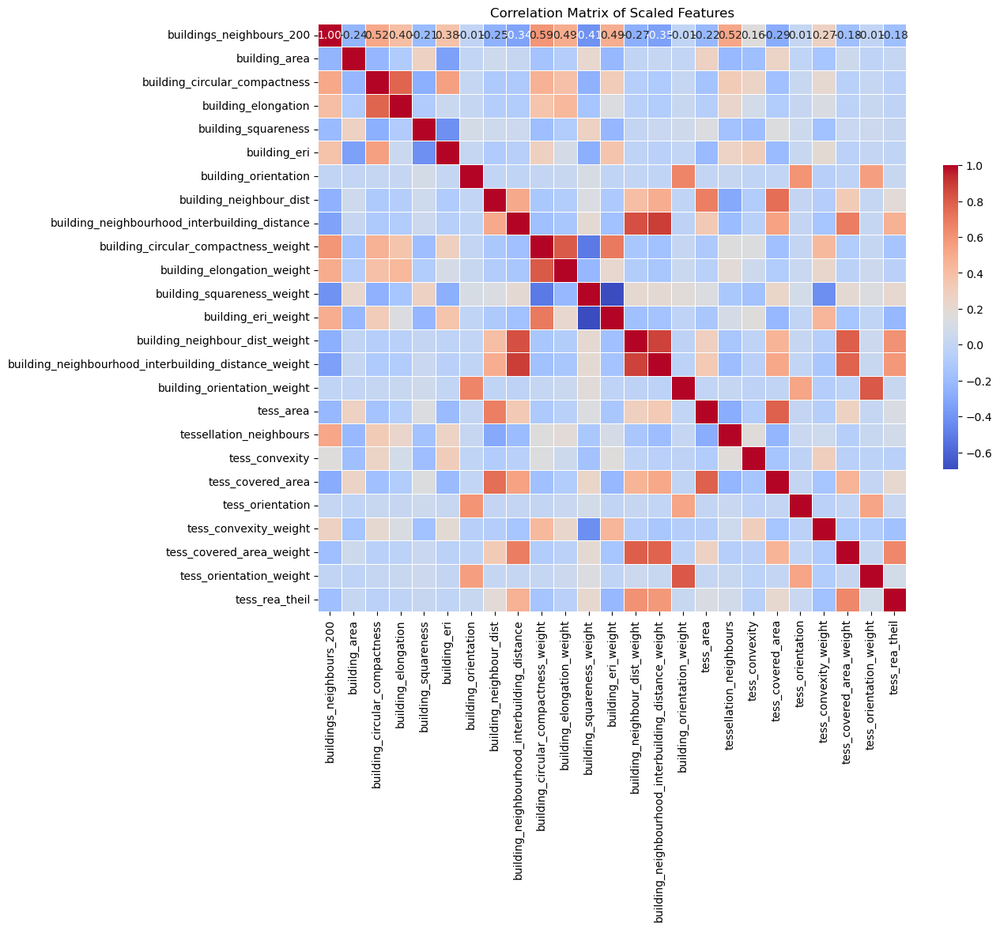

In [13]:
# Convert the numpy array back to a pandas DataFrame
X_scaled_df = pd.DataFrame(X_scaled, columns=X.columns)

# Calculate the correlation matrix
corr_matrix = X_scaled_df.corr()

# Set up the matplotlib figure
plt.figure(figsize=(12, 10))

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', 
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

# Adding title
plt.title('Correlation Matrix of Scaled Features')

# Show the plot
plt.show()

In [14]:
residuals = y - predictions

In [15]:
# # Creating a residual plot with Seaborn
# plt.figure(figsize=(10, 6))
# sns.residplot(x=predictions, y=residuals, lowess=True, scatter_kws={'alpha': 0.05, 's': 10}, line_kws={'color': 'red'})
# plt.xlabel('Predicted Values')
# plt.ylabel('Residuals')
# plt.title('Seaborn Residual Plot')
# plt.show()

In [16]:
# plt.figure(figsize=(8, 6))
# stats.probplot(residuals, dist="norm", plot=plt)
# plt.title('Q-Q Plot of Residuals')
# plt.xlabel('Theoretical Quantiles')
# plt.ylabel('Ordered Values')
# plt.show()

In [17]:
raster_data = gpd.read_parquet(f"output/{place}/raster_data.pq").to_crs(local_crs)

In [18]:
raster_data

,land,ghs-smod,ghs-built-v,ghs-built-c,ghs-pop,ghs-built-s,row,col,geometry
32,10000,30,43244,13,133,3687,1,1,"POLYGON ((258217.703 666785.345, 258285.067 66..."
33,10000,30,41874,9,99,3687,1,2,"POLYGON ((258285.067 666783.137, 258352.432 66..."
34,9995,30,38830,7,99,3354,1,3,"POLYGON ((258352.432 666780.929, 258419.797 66..."
35,9964,30,30717,6,83,3249,1,4,"POLYGON ((258419.797 666778.723, 258487.161 66..."
36,9964,30,26824,8,74,3249,1,5,"POLYGON ((258487.161 666776.518, 258554.526 66..."
...,...,...,...,...,...,...,...,...,...
553,9991,30,23438,9,45,3404,17,26,"POLYGON ((259839.723 664813.315, 259907.118 66..."
554,9961,30,26233,10,45,3263,17,27,"POLYGON ((259907.118 664811.133, 259974.513 66..."
555,9961,30,23970,20,23,3263,17,28,"POLYGON ((259974.513 664808.951, 260041.908 66..."
556,9892,30,23970,5,23,3713,17,29,"POLYGON ((260041.908 664806.770, 260109.303 66..."


In [19]:
# Create a 50 km buffer around the point
buffer_circle = gpd.GeoDataFrame({'geometry': [Point(lon, lat)]}, crs=4326).to_crs(local_crs).buffer(radius * 1000)

In [20]:
# Get bounds
minx, miny, maxx, maxy = raster_data.total_bounds
min_dist = min([abs(minx-lonlat[1]), abs(miny-lonlat[0]), abs(maxx-lonlat[1]), abs(maxy-lonlat[0])])

# Create a GeoDataFrame with the specified point
gdf = gpd.GeoDataFrame(geometry=[Point(lonlat[0], lonlat[1])], crs=crs)

# The UTM zone number can be calculated from the longitude
utm_zone = int((lonlat[0] + 180) / 6) + 1
# Determine the hemisphere and assign the appropriate UTM CRS
if lonlat[1] >= 0:  # Northern Hemisphere
    local_utm_crs = f'EPSG:326{utm_zone:02d}'
else:  # Southern Hemisphere
    local_utm_crs = f'EPSG:327{utm_zone:02d}'

# Reproject to a local UTM CRS
gdf_utm = gdf.to_crs(local_utm_crs)

# Create a 50 km buffer around the point
buffer_circle = gdf_utm.buffer((radius) * 1000).to_crs(local_crs)  # Convert km to meters

In [21]:
# # Create a plot
# fig, ax = plt.subplots(figsize=(10, 10))

# # Plot the first GeoDataFrame
# cells_in_circle.plot(ax=ax, color='blue', edgecolor='k', alpha=0.2)  # Adjust color and edgecolor as needed

# # Plot the second GeoDataFrame on the same axes
# buffer_circle.plot(ax=ax, color='red', alpha=0.2)  # Adjust color and alpha for transparency as needed

# tessellation.plot(ax=ax, color="green", alpha=0.4)

# # Optionally set axis limits or other plot properties
# # ax.set_xlim([xmin, xmax])
# # ax.set_ylim([ymin, ymax])

# ctx.add_basemap(ax, crs=local_crs,source=ctx.providers.CartoDB.Positron)

# plt.show()

In [22]:
cells_in_circle = raster_data[raster_data["geometry"].within(buffer_circle.geometry[0])]


<Axes: >

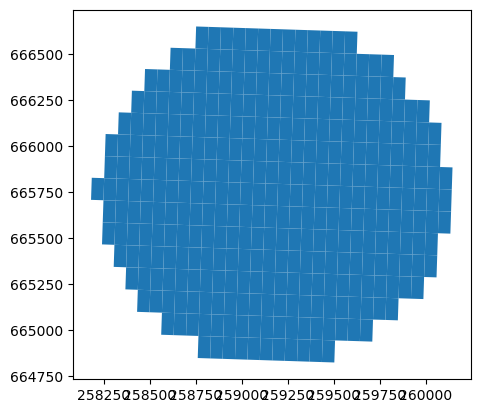

In [23]:
cells_in_circle.plot()

In [24]:
cells_in_circle

,land,ghs-smod,ghs-built-v,ghs-built-c,ghs-pop,ghs-built-s,row,col,geometry
71,9996,30,20833,4,31,4006,2,9,"POLYGON ((258752.707 666647.887, 258820.074 66..."
72,9999,30,17688,22,23,3318,2,10,"POLYGON ((258820.074 666645.686, 258887.440 66..."
73,9995,30,17688,11,23,3173,2,11,"POLYGON ((258887.440 666643.487, 258954.807 66..."
74,9989,30,14777,0,6,3025,2,12,"POLYGON ((258954.807 666641.289, 259022.174 66..."
75,9905,30,16685,0,4,2088,2,13,"POLYGON ((259022.174 666639.092, 259089.541 66..."
...,...,...,...,...,...,...,...,...,...
512,9990,30,42383,23,38,6581,16,16,"POLYGON ((259169.674 664955.020, 259237.067 66..."
513,9990,30,42383,21,45,6048,16,17,"POLYGON ((259237.067 664952.827, 259304.459 66..."
514,9988,30,38059,13,31,4998,16,18,"POLYGON ((259304.459 664950.635, 259371.852 66..."
515,9996,30,34486,21,31,4649,16,19,"POLYGON ((259371.852 664948.444, 259439.245 66..."


In [25]:
cells_in_circle.explore()

In [26]:
# # Assuming cells_in_circle is a GeoDataFrame
# fig, ax = plt.subplots()
# cells_in_circle.plot(column='row', ax=ax, cmap='Blues')
# plt.show()

In [27]:
buildings

,uID,geometry,buildings_neighbours_200,building_area,building_circular_compactness,building_elongation,building_squareness,building_eri,building_orientation,building_neighbour_dist,building_neighbourhood_interbuilding_distance,building_circular_compactness_weight,building_elongation_weight,building_squareness_weight,building_eri_weight,building_neighbour_dist_weight,building_neighbourhood_interbuilding_distance_weight,building_orientation_weight
0,0,"POLYGON ((253894.911 667992.009, 253874.743 66...",0.572746,393.721492,0.611691,0.977598,0.023740,0.811813,3.700646,11.330833,27.007815,0.538351,0.736955,0.036529,0.922705,31.937825,38.133467,9.723695
1,1,"POLYGON ((257873.072 660535.923, 257814.018 66...",0.577762,517.390250,0.180988,0.145153,0.027922,1.000026,8.449315,14.230538,18.497476,0.253978,0.289323,0.028282,0.898005,20.743583,22.023416,9.006310
2,2,"POLYGON ((258731.422 660456.589, 258651.296 66...",0.296874,1530.778738,0.129518,0.131325,0.121170,0.863361,39.274035,23.254436,23.528580,0.376825,0.499307,3.209881,0.866512,23.186340,25.185960,25.749789
3,3,"POLYGON ((254252.042 665895.371, 254246.914 66...",0.172877,1011.766821,0.330530,0.464872,0.012413,0.716023,5.196538,190.204055,59.498746,0.357566,0.485609,0.025985,0.781988,44.159712,59.747055,8.231368
4,4,"POLYGON ((260928.028 666183.814, 260938.721 66...",1.318206,223.547328,0.423530,0.474093,0.070158,0.927363,15.726292,18.048086,22.200593,0.359628,0.439393,2.956276,0.885779,24.793331,27.445650,20.063417
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40930,40930,"POLYGON ((261598.050 664298.257, 261581.647 66...",1.561959,159.896719,0.498677,0.511688,0.084276,0.982110,24.291513,12.400708,17.920671,0.398438,0.479865,5.828516,0.917947,19.337890,20.639477,20.243316
40931,40931,"POLYGON ((263173.291 664689.249, 263194.421 66...",1.288954,192.046387,0.459999,0.427381,0.025262,1.000018,4.560922,20.101612,24.097258,0.405019,0.578314,6.463505,0.827788,31.436779,25.692355,23.245777
40932,40932,"POLYGON ((262230.343 670792.684, 262237.303 67...",3.230181,78.225339,0.599314,0.706189,0.086031,1.000091,20.694099,8.724361,20.652532,0.584577,0.768969,0.094250,0.978848,16.126944,18.305396,24.017631
40933,40933,"POLYGON ((262847.006 666028.488, 262817.617 66...",1.164846,336.773661,0.418357,0.374840,0.039373,1.000058,11.308662,14.884064,21.290963,0.449983,0.453905,1.501600,0.978838,21.550427,21.465651,22.431394


In [28]:
cells_in_circle.reset_index()[["geometry", "row", "col"]]

,geometry,row,col
0,"POLYGON ((258752.707 666647.887, 258820.074 66...",2,9
1,"POLYGON ((258820.074 666645.686, 258887.440 66...",2,10
2,"POLYGON ((258887.440 666643.487, 258954.807 66...",2,11
3,"POLYGON ((258954.807 666641.289, 259022.174 66...",2,12
4,"POLYGON ((259022.174 666639.092, 259089.541 66...",2,13
...,...,...,...
335,"POLYGON ((259169.674 664955.020, 259237.067 66...",16,16
336,"POLYGON ((259237.067 664952.827, 259304.459 66...",16,17
337,"POLYGON ((259304.459 664950.635, 259371.852 66...",16,18
338,"POLYGON ((259371.852 664948.444, 259439.245 66...",16,19


In [29]:
buildings_joint = buildings.sjoin(cells_in_circle.reset_index()[["geometry", "row", "col"]], how='inner', op="intersects")

/home/virgilxw/miniforge3/envs/processor/lib/python3.12/site-packages/IPython/core/interactiveshell.py:3550: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [30]:
buildings_joint.explore()

In [31]:
joint_gdf = tessellation.join(buildings_joint, on="uID", how="inner", lsuffix="_tess", rsuffix="_build").drop(["uID_tess"], axis=1)

In [32]:
joint_gdf.set_geometry("geometry_build")

,uID,geometry_tess,tess_area,tessellation_neighbours,tess_convexity,tess_covered_area,tess_orientation,tess_convexity_weight,tess_covered_area_weight,tess_orientation_weight,...,building_circular_compactness_weight,building_elongation_weight,building_squareness_weight,building_eri_weight,building_neighbour_dist_weight,building_neighbourhood_interbuilding_distance_weight,building_orientation_weight,index_right,row,col
51,51,"POLYGON ((259897.638 666124.781, 259897.138 66...",4267.678152,0.078549,0.890109,36559.990850,7.755103,0.940096,47446.617979,9.062942,...,0.514908,0.697991,0.842878,0.893463,38.989086,35.183139,4.421646,74,5,26
76,76,"POLYGON ((259827.291 665376.778, 259826.852 66...",1412.559277,0.253568,0.879135,35164.205771,0.875671,0.915117,85787.947271,11.893001,...,0.381461,0.549990,14.554672,0.754242,27.890221,27.284091,11.268751,264,12,26
76,76,"POLYGON ((259827.291 665376.778, 259826.852 66...",1412.559277,0.253568,0.879135,35164.205771,0.875671,0.915117,85787.947271,11.893001,...,0.381461,0.549990,14.554672,0.754242,27.890221,27.284091,11.268751,263,12,25
88,88,"POLYGON ((259851.838 665203.400, 259852.094 66...",6158.476863,0.118665,0.947574,34694.560749,19.556933,0.934406,60170.211010,20.427701,...,0.421132,0.648527,11.666600,0.833314,29.600703,28.721354,17.042692,311,14,25
88,88,"POLYGON ((259851.838 665203.400, 259852.094 66...",6158.476863,0.118665,0.947574,34694.560749,19.556933,0.934406,60170.211010,20.427701,...,0.421132,0.648527,11.666600,0.833314,29.600703,28.721354,17.042692,289,13,26
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25571,25571,"POLYGON ((258480.370 665118.350, 258479.896 66...",3728.140464,0.247581,0.997236,66634.279655,10.786593,0.921758,156295.914768,10.122392,...,0.332142,0.442614,16.489361,0.736318,8.421101,13.717697,12.695585,291,14,5
25601,25601,"POLYGON ((259283.182 666348.714, 259286.617 66...",6421.419306,0.089083,0.933238,25961.861652,38.403327,0.898752,46860.801808,24.197154,...,0.383936,0.618351,6.229241,0.698105,20.102330,23.574846,23.284122,64,5,16
25601,25601,"POLYGON ((259283.182 666348.714, 259286.617 66...",6421.419306,0.089083,0.933238,25961.861652,38.403327,0.898752,46860.801808,24.197154,...,0.383936,0.618351,6.229241,0.698105,20.102330,23.574846,23.284122,43,4,17
25601,25601,"POLYGON ((259283.182 666348.714, 259286.617 66...",6421.419306,0.089083,0.933238,25961.861652,38.403327,0.898752,46860.801808,24.197154,...,0.383936,0.618351,6.229241,0.698105,20.102330,23.574846,23.284122,42,4,16


In [33]:
tessellation_not_in_buildings = tessellation[~tessellation['uID'].isin(buildings_joint['uID'])]

<Axes: >

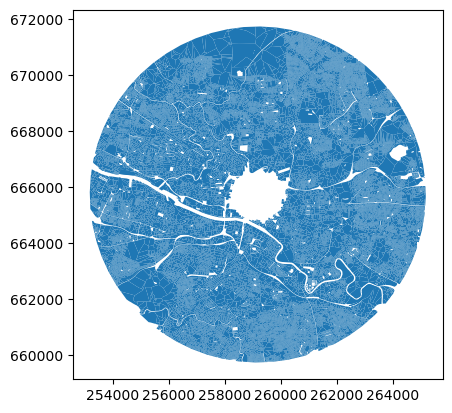

In [34]:
tessellation_not_in_buildings.plot()

In [35]:
joint_gdf = joint_gdf.set_geometry("geometry_build")

In [36]:
joint_gdf.to_parquet(f"output/{place}/p5-buildings-output.pq")

In [37]:
# Create a copy of the joint_gdf to avoid modifying the original while iterating
joint_gdf_copy = joint_gdf.copy()

# List to hold the new rows
new_rows = []

for index, row in joint_gdf.iterrows():
    for x in range(-1, 2):  # Adjusted range to include -1, 0, 1
        for y in range(-1, 2):  # Adjusted range to include -1, 0, 1
            if x == 0 and y == 0:  # Skip the current cell
                continue
            else:
                # Copy the current row and modify 'row' and 'col'
                new_row = row.copy()
                new_row["row"] += x
                new_row["col"] += y
                new_rows.append(new_row)

# Convert the list of new rows to a GeoDataFrame and concatenate it with the original
new_rows_gdf = gpd.GeoDataFrame(new_rows)
joint_gdf = pd.concat([joint_gdf_copy, new_rows_gdf], ignore_index=True)


In [38]:
# Assuming 'gdf' is your GeoDataFrame
# Convert GeoDataFrame to Dask DataFrame
dask_df = dd.from_pandas(joint_gdf.drop(["geometry_tess", "geometry_build", "uID", "uID_build", "index_right"], axis=1), npartitions=10)  # You can adjust the number of partitions

# Group by 'row' and 'col'
grouped = dask_df.groupby(["row", "col"])

stats_df = grouped.aggregate(['median'], shuffle='tasks').compute()

In [39]:
out = {}

for column in joint_gdf.drop(["geometry_tess", "geometry_build", "uID", "uID_build", "index_right", "row", "col"], axis=1).columns:
    print(column)
    q25 = grouped[column].apply(lambda x: x.quantile(0.25), meta=('x', 'f8')).compute()
    q25.name = f"q25"
    q75 = grouped[column].apply(lambda x: x.quantile(0.75), meta=('x', 'f8')).compute()
    q75.name = f"q75"
    # kurtosis = grouped[column].apply(lambda x: x.kurtosis(), meta=('x', 'f8')).compute()
    # kurtosis.name = f"kurtosis"
    # skew =  grouped[column].apply(lambda x: x.skew(), meta=('x', 'f8')).compute()
    # skew.name = f"skew"
    
    out[column] = [stats_df[column], q25, q75]


tess_area
tessellation_neighbours
tess_convexity
tess_covered_area
tess_orientation
tess_convexity_weight
tess_covered_area_weight
tess_orientation_weight
tess_rea_theil
buildings_neighbours_200
building_area
building_circular_compactness
building_elongation
building_squareness
building_eri
building_orientation
building_neighbour_dist
building_neighbourhood_interbuilding_distance
building_circular_compactness_weight
building_elongation_weight
building_squareness_weight
building_eri_weight
building_neighbour_dist_weight
building_neighbourhood_interbuilding_distance_weight
building_orientation_weight


In [40]:
concat_df = pd.DataFrame()

In [41]:
for key in out:
    # Concatenate the Series
    concatenated = pd.concat(out[key], axis=1)

    # Create a MultiIndex using the key and the column names of the concatenated DataFrame
    multi_index = pd.MultiIndex.from_tuples([(key, col) for col in concatenated.columns])

    # Set the MultiIndex to the concatenated DataFrame
    concatenated.columns = multi_index

    # Combine the concatenated DataFrame into stats_df
    concat_df = pd.concat([concat_df, concatenated], axis=1)

In [42]:
# Assume df is your DataFrame

# Transpose the DataFrame
df_transposed = concat_df.T

# Find duplicated rows (originally columns)
duplicates = df_transposed.duplicated()

# List out the names of duplicate columns
duplicate_columns = df_transposed.index[duplicates].tolist()

# Print or process the duplicate column names
print("Duplicate columns:", duplicate_columns)

Duplicate columns: []


In [43]:
# Calculate the count of entries in each cell
cell_counts = dask_df.groupby(['row', 'col']).size().compute()
cell_counts_df = cell_counts.reset_index(name='entry_count')

In [44]:
concat_df

tess_area                             tessellation_neighbours  \
               median           q25           q75                  median   
row col                                                                     
5   26    6434.246025   3120.234267   8222.970961                0.082137   
12  26    2593.431666   1810.351235   6039.435581                0.148232   
    25    6079.116008   2289.680717   9559.958226                0.139619   
14  25    5468.394987   4505.871866   6586.063746                0.125613   
13  26    4707.878973   1759.473029   6158.476863                0.135059   
...               ...           ...           ...                     ...   
1   11   15832.643117  15416.997485  16248.288748                0.040453   
2   11   15832.643117  15416.997485  16248.288748                0.040453   
16  6    16223.594973  16223.594973  16223.594973                0.120926   
    24    6825.613535   6320.496004   9447.195989                0.153580   
2   6     5897.213919   5897.213919   5897.213919                0.105863   

                            tess_convexity                      \
              q25       q75         median       q25       q75   
row col                                                          
5   26   0.064904  0.115035       0.943027  0.928725  0.971086   
12  26   0.131110  0.188530       0.947574  0.897909  0.967978   
    25   0.125440  0.181992       0.925777  0.888982  0.971530   
14  25   0.109424  0.144179       0.947574  0.861820  0.972709   
13  26   0.118665  0.179201       0.940828  0.879135  0.972147   
...           ...       ...            ...       ...       ...   
1   11   0.039266  0.041639       0.550968  0.522839  0.579097   
2   11   0.039266  0.041639       0.550968  0.522839  0.579097   
16  6    0.120926  0.120926       0.923438  0.923438  0.923438   
    24   0.149800  0.159682       0.968585  0.958562  0.976717   
2   6    0.105863  0.105863       0.915550  0.915550  0.915550   

        tess_covered_area  ... building_eri_weight  \
                   median  ...                 q75   
row col                    ...                       
5   26       40644.163606  ...            0.898019   
12  26       29371.556517  ...            0.769974   
    25       34929.383260  ...            0.801259   
14  25       34694.560749  ...            0.831228   
13  26       31965.095505  ...            0.820341   
...                   ...  ...                 ...   
1   11      110995.021116  ...            0.831923   
2   11      110995.021116  ...            0.831923   
16  6       160342.002533  ...            0.745827   
    24       47136.857572  ...            0.784489   
2   6        67210.065069  ...            0.856505   

        building_neighbour_dist_weight                        \
                                median        q25        q75   
row col                                                        
5   26                       38.989086  38.150312  39.207205   
12  26                       28.369662  27.282637  29.692589   
    25                       27.405506  26.104282  28.100594   
14  25                       27.566044  26.273129  29.297232   
13  26                       28.853521  27.566044  30.390725   
...                                ...        ...        ...   
1   11                       41.756073  41.746996  41.765149   
2   11                       41.756073  41.746996  41.765149   
16  6                         8.956006   8.956006   8.956006   
    24                       23.378874  23.120925  23.870997   
2   6                        42.758975  42.758975  42.758975   

        building_neighbourhood_interbuilding_distance_weight             \
                                                      median        q25   
row col                                                                   
5   26                                           35.127480    34.868005   
12  26                                           28.15

In [45]:
raster_data

,land,ghs-smod,ghs-built-v,ghs-built-c,ghs-pop,ghs-built-s,row,col,geometry
32,10000,30,43244,13,133,3687,1,1,"POLYGON ((258217.703 666785.345, 258285.067 66..."
33,10000,30,41874,9,99,3687,1,2,"POLYGON ((258285.067 666783.137, 258352.432 66..."
34,9995,30,38830,7,99,3354,1,3,"POLYGON ((258352.432 666780.929, 258419.797 66..."
35,9964,30,30717,6,83,3249,1,4,"POLYGON ((258419.797 666778.723, 258487.161 66..."
36,9964,30,26824,8,74,3249,1,5,"POLYGON ((258487.161 666776.518, 258554.526 66..."
...,...,...,...,...,...,...,...,...,...
553,9991,30,23438,9,45,3404,17,26,"POLYGON ((259839.723 664813.315, 259907.118 66..."
554,9961,30,26233,10,45,3263,17,27,"POLYGON ((259907.118 664811.133, 259974.513 66..."
555,9961,30,23970,20,23,3263,17,28,"POLYGON ((259974.513 664808.951, 260041.908 66..."
556,9892,30,23970,5,23,3713,17,29,"POLYGON ((260041.908 664806.770, 260109.303 66..."


In [46]:
raster_data = raster_data.set_index(["row", "col"])

In [47]:
concat_df = concat_df.dropna()

In [48]:
out_df = gpd.GeoDataFrame(pd.concat([concat_df, raster_data], axis=1).reset_index(), geometry="geometry")
out_df = out_df.merge(cell_counts_df, on=['row', 'col'], how='left')

In [49]:
out_df = out_df.drop(columns=["geometry"], axis=1)
out_df = out_df.merge(cells_in_circle[["geometry", "row", "col"]], on=["row", "col"], how="inner")

In [50]:
out_df = gpd.GeoDataFrame(out_df, geometry='geometry')

In [51]:
# Function to flatten and clean column names (tuples or strings) from the GeoDataFrame
def clean_column_names(columns):
    clean_names = []
    for col in columns:
        if isinstance(col, tuple):
            clean_name = '_'.join(part.strip() for part in col)
        else:
            clean_name = col.strip()
        clean_names.append(clean_name)
    return clean_names

# Apply the cleaning function to the GeoDataFrame columns
out_df.columns = clean_column_names(out_df.columns)
out_df.columns.tolist()

['row',
 'col',
 'tess_area_median',
 'tess_area_q25',
 'tess_area_q75',
 'tessellation_neighbours_median',
 'tessellation_neighbours_q25',
 'tessellation_neighbours_q75',
 'tess_convexity_median',
 'tess_convexity_q25',
 'tess_convexity_q75',
 'tess_covered_area_median',
 'tess_covered_area_q25',
 'tess_covered_area_q75',
 'tess_orientation_median',
 'tess_orientation_q25',
 'tess_orientation_q75',
 'tess_convexity_weight_median',
 'tess_convexity_weight_q25',
 'tess_convexity_weight_q75',
 'tess_covered_area_weight_median',
 'tess_covered_area_weight_q25',
 'tess_covered_area_weight_q75',
 'tess_orientation_weight_median',
 'tess_orientation_weight_q25',
 'tess_orientation_weight_q75',
 'tess_rea_theil_median',
 'tess_rea_theil_q25',
 'tess_rea_theil_q75',
 'buildings_neighbours_200_median',
 'buildings_neighbours_200_q25',
 'buildings_neighbours_200_q75',
 'building_area_median',
 'building_area_q25',
 'building_area_q75',
 'building_circular_compactness_median',
 'building_circular

In [52]:
out_df.explore()

In [53]:
out_df_expanded = out_df

In [54]:
for index, row in out_df.iterrows():
    geometry_list = [row.geometry]
    for x in range(-1, 2):  # Adjusted range to include -1, 0, 1
        for y in range(-1, 2):  # Adjusted range to include -1, 0, 1
            # Filter out_df for the specific row and column values
            filtered_df = out_df[(out_df["row"] == row.row + x) & (out_df["col"] == row.col + y)]
            # Check if the filtered_df is not empty
            if not filtered_df.empty:
                # Append the geometry of the first row from the filtered dataframe
                geometry_list.append(filtered_df.geometry.iloc[0])
    
    # Update the 'out_df_expanded' with the unified geometry
    out_df_expanded.loc[(out_df_expanded['row'] == row.row) & (out_df_expanded['col'] == row.col), 'geometry'] = unary_union(geometry_list)

In [55]:
def calculate_statistics(name, nodes, out_df):
    # Spatial join - associating each node with a polygon
    joined = gpd.sjoin(nodes, out_df, how='inner', op='intersects')

    # Creating a list to hold results
    results = []

    # Iterating through each unique polygon in the spatial join
    for polygon_id in joined['index_right'].unique():
        # Filter to include only nodes within the current polygon
        nodes_in_polygon = joined[joined['index_right'] == polygon_id]

        # Calculating statistics for each column
        stats = {'polygon_id': polygon_id}
        
        stats[f'nodes_count'] = nodes_in_polygon.iloc[0].count()
        
        for column in nodes.columns:
            if nodes[column].dtype in ['int64', 'float64']:  # Check if column is numeric
                # stats[f'{column}_max'] = nodes_in_polygon[column].max()
                # stats[f'{column}_min'] = nodes_in_polygon[column].min()
                stats[f'{name}_{column}_median'] = nodes_in_polygon[column].median()
                for quantile, value in nodes_in_polygon[column].quantile([0.25, 0.5, 0.75]).items():
                    stats[f'{name}_{column}_quantile_{quantile}'] = value

        # Adding stats for this polygon to the results list
        results.append(stats)

    # Creating a DataFrame from the results
    stats_df = pd.DataFrame(results)

    # Ensuring that the merge key in out_df is a regular column (not an index)
    
    out_df.explore()
    
    out_df['polygon_id'] = out_df.index

    # Merging the stats DataFrame with the out_df GeoDataFrame
    merged_df = out_df.merge(stats_df, on='polygon_id', how='left')
    
    merged_df = merged_df.drop(columns=["polygon_id"], axis = 1)

    return merged_df

In [56]:
out_df_expanded = calculate_statistics("nodes", nodes, out_df_expanded)

/home/virgilxw/miniforge3/envs/processor/lib/python3.12/site-packages/IPython/core/interactiveshell.py:3550: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [57]:
def calculate_line_statistics(name, edges, out_df):
    # Spatial join - associating each line with polygons it intersects
    joined = gpd.sjoin(edges, out_df, how='inner', op='intersects')

    # Creating a list to hold results
    results = []

    # Iterating through each unique polygon in the spatial join
    for polygon_id in joined['index_right'].unique():
        # Filter to include only lines intersecting the current polygon
        lines_in_polygon = joined[joined['index_right'] == polygon_id]
        
        # Calculating statistics for each column
        stats = {'polygon_id': polygon_id}
        
        stats[f'{name}_count'] = lines_in_polygon.iloc[0].count()

        for column in edges.columns:
            if edges[column].dtype in ['int64', 'float64']:  # Check if column is numeric
                # stats[f'{name}_{column}_max'] = lines_in_polygon[column].max()
                # stats[f'{name}_{column}_min'] = lines_in_polygon[column].min()
                stats[f'{name}_{column}_median'] = lines_in_polygon[column].median()
                for quantile, value in lines_in_polygon[column].quantile([0.25, 0.5, 0.75]).items():
                    stats[f'{name}_{column}_quantile_{quantile}'] = value

        # Adding stats for this polygon to the results list
        results.append(stats)

    # Creating a DataFrame from the results
    stats_df = pd.DataFrame(results)

    # Ensuring that the merge key in out_df is a regular column (not an index)
    out_df['polygon_id'] = out_df.index

    # Merging the stats DataFrame with the out_df GeoDataFrame
    merged_df = out_df.merge(stats_df, on='polygon_id', how="left")

    return merged_df

In [58]:
edges = edges.drop(["mm_len", "node_start", "node_end"], axis=1)

In [59]:
out_df_expanded = calculate_line_statistics("edges", edges, out_df_expanded)

/home/virgilxw/miniforge3/envs/processor/lib/python3.12/site-packages/IPython/core/interactiveshell.py:3550: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [60]:
out_df_expanded = calculate_line_statistics("strokes", stroke, out_df_expanded)

/home/virgilxw/miniforge3/envs/processor/lib/python3.12/site-packages/IPython/core/interactiveshell.py:3550: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [61]:
out_df_expanded = out_df_expanded.drop(columns=["geometry"], axis=1)
out_df = out_df_expanded.merge(cells_in_circle[["geometry", "row", "col"]], on=["row", "col"], how="inner")

In [62]:
# Convert the merged DataFrame to a GeoDataFrame
geo_df = gpd.GeoDataFrame(out_df, geometry='geometry')

In [75]:
geo_df = geo_df.drop(columns=["polygon_id"])

In [76]:
geo_df.explore()

In [77]:
geo_df.to_parquet(f"output/{place}/p5-grid-output.pq")

In [65]:
# with rasterio.open(f'output/{place}/p5.tif') as src:
#     # Get the transform object
#     transform = src.transform

#     # Extract west, north, and resolution (xres, yres)
#     west = transform.c
#     north = transform.f
#     xres = transform.a
#     yres = -transform.e  # yres is negative as raster origin is top-left


In [66]:

# # Open the source raster to get the transform
# with rasterio.open(f'output/{place}.tif') as src:
#     transform = src.transform

#     west = transform.c
#     north = transform.f
#     xres = transform.a
#     yres = -transform.e  # yres is negative as raster origin is top-left

# # Calculate raster dimensions
# n_rows = gdf['row'].max() - gdf['row'].min() + 1
# n_cols = gdf['col'].max() - gdf['col'].min() + 1

# # List of columns to be used as bands
# band_columns = [col for col in gdf.columns if col not in ['row', 'col', 'geometry']]

# # Initialize raster dataset
# with rasterio.open(f"output/{place}/grid_with_summary_stats.tif", 'w', 
#     driver='GTiff', 
#     height=n_rows, 
#     width=n_cols, 
#     count=len(band_columns), 
#     dtype=str(gdf[band_columns[0]].dtype), 
#     crs=gdf.crs, 
#     transform=transform
# ) as dst:
#     for i, column in enumerate(band_columns, start=1):
#         # Create an empty array filled with NaNs (or use a different no-data value)
#         if column == 'building_height':
#             # For 'building_height', initialize with zeros
#             band_data = np.zeros((n_rows, n_cols))
#         else:
#             # For other columns, initialize with NaNs
#             band_data = np.full((n_rows, n_cols), np.nan)

#         # Update the array with data from the GeoDataFrame
#         for _, row in gdf.iterrows():
#             row_idx, col_idx = row['row'] - gdf['row'].min(), row['col'] - gdf['col'].min()
#             band_data[row_idx, col_idx] = row[column]

#         dst.write(band_data, i)

In [67]:
# gdf['distance_to_centre'] = gdf['geometry'].distance(centre_point_local_crs)

In [68]:
# new_gdf = gdf.drop(columns=["geometry", "row", "col"]).dropna()

In [69]:
# # Response variable
# y = new_gdf['distance_to_centre']

# # Feature variables (excluding the response variable)
# X = new_gdf.drop(columns=['distance_to_centre'])

# # Standardize the features
# scaler = StandardScaler()
# X_scaled = scaler.fit_transform(X)

# # Initialize and fit the Linear Regression model
# model = LinearRegression()
# model.fit(X_scaled, y)

# # Coefficients and Intercept
# coefficients = model.coef_
# intercept = model.intercept_

# # Predictions
# predictions = model.predict(X_scaled)

# # Number of observations and number of features
# n = len(y)
# p = X.shape[1]

# # Residual Sum of Squares and Total Sum of Squares
# rss = np.sum((y - predictions) ** 2)
# tss = np.sum((y - np.mean(y)) ** 2)

# # R-squared and Adjusted R-squared
# r_squared = 1 - (rss / tss)
# adjusted_r_squared = 1 - ((1 - r_squared) * (n - 1) / (n - p - 1))

# # Standard Error of the coefficients
# mse = rss / (n - p - 1)
# se = np.sqrt(np.diagonal(mse * np.linalg.inv(np.dot(X_scaled.T, X_scaled))))

# # t-statistics and p-values for coefficients
# t_stats = coefficients / se
# p_values = [2 * (1 - stats.t.cdf(np.abs(t), n - p - 1)) for t in t_stats]

# # F-statistic
# f_statistic = (r_squared / p) / ((1 - r_squared) / (n - p - 1))

# def get_significance_asterisks(p):
#     if p < 0.001:
#         return '***'
#     elif p < 0.01:
#         return '**'
#     elif p < 0.05:
#         return '*'
#     else:
#         return ''

# # Create a summary DataFrame
# summary_df = pd.DataFrame({
#     'Coefficient': coefficients,
#     'Standard Error': se,
#     't value': t_stats,
#     'p value': p_values,
#     'Significance': [get_significance_asterisks(p) for p in p_values]
# }, index=X.columns)
# summary_df.loc['Intercept'] = [intercept, np.nan, np.nan, np.nan, '']

# # Print summary statistics
# print(f"Number of Observations: {n}")
# print(f"R-squared: {r_squared}")
# print(f"Adjusted R-squared: {adjusted_r_squared}")
# print(f"F-statistic: {f_statistic}\n")

In [70]:
# summary_df.to_string()

In [71]:
# # Assuming 'summary_df' is your DataFrame
# # Set the display options
# pd.set_option('display.max_rows', None)  # Replace None with a specific number if the DataFrame is very large
# pd.set_option('display.max_columns', None)
# pd.set_option('display.width', None)  # Adjust the width for better readability if necessary
# pd.set_option('display.max_colwidth', None)  # Adjust column width to show full content of each cell

In [72]:
# summary_df

In [73]:
# summary_df.to_parquet(f"output/{place}/summary_df.pq")